In [2]:
import json
import os
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from sklearn.metrics import accuracy_score, classification_report
from transformers import AutoModel, AutoTokenizer, get_scheduler
from torch.utils.data import Dataset, DataLoader, RandomSampler, SequentialSampler
from torch.optim import AdamW
from tqdm.notebook import tqdm, trange
from time import perf_counter
from PIL import Image
import pandas as pd
#from google.colab import drive
from PIL import Image
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# set random seeds for repeatability
import numpy as np
import random

def set_seed(seed_val):
    random.seed(seed_val)
    np.random.seed(seed_val)
    torch.manual_seed(seed_val)
    torch.cuda.manual_seed_all(seed_val)

In [4]:
seed_val = 42
set_seed(seed_val)

In [55]:
!unzip "../Toybox/05-09-2024_all_images.zip" -d "../../temp"
!unzip "../Toybox/Generated Images.zip" -d "../../temp"
!unzip "../Toybox/Generated_Images_7-2-24.zip" -d "../../temp"



Archive:  ../Toybox/05-09-2024_all_images.zip
   creating: ../../temp/05-09-2024_all_images
  inflating: ../../temp/05-09-2024_all_images/0.png  
  inflating: ../../temp/05-09-2024_all_images/1.png  
  inflating: ../../temp/05-09-2024_all_images/10.png  
  inflating: ../../temp/05-09-2024_all_images/100.png  
  inflating: ../../temp/05-09-2024_all_images/1000.png  
  inflating: ../../temp/05-09-2024_all_images/10000.png  
  inflating: ../../temp/05-09-2024_all_images/10001.png  
  inflating: ../../temp/05-09-2024_all_images/10002.png  
  inflating: ../../temp/05-09-2024_all_images/10003.png  
  inflating: ../../temp/05-09-2024_all_images/10004.png  
  inflating: ../../temp/05-09-2024_all_images/10005.png  
  inflating: ../../temp/05-09-2024_all_images/10006.png  
  inflating: ../../temp/05-09-2024_all_images/10007.png  
  inflating: ../../temp/05-09-2024_all_images/10008.png  
  inflating: ../../temp/05-09-2024_all_images/10009.png  
  inflating: ../../temp/05-09-2024_all_images/1001.p

In [56]:
dir_1 = os.listdir("../../temp/05-09-2024_all_images")
dir_2 = os.listdir("../../temp/Generated Images")
dir_3 = os.listdir("../../temp/Generated_Images_7-2-24")

In [57]:
# original file: 2024-08-15_curr_df.pkl; same exact data frame as manual_classification_cl6.pkl
with open("../FINAL/data/manual_classification_cl6.pkl", 'rb') as f:
  feats_df = pickle.load(f) # deserialize using load()

print("shape:", feats_df.shape)
feats_df.head()

shape: (7307, 5)


,class,noise,path,seed,dir
0,3,4,noise 4 20604.0.png,20604.0,/content/Generated_Images_7-2-24/
1,3,6,noise 6 20289.0.png,20289.0,/content/Generated_Images_7-2-24/
2,4,23782.0,noise 6 23782.0.png,23782.0,/content/Generated Images/
3,2,2,7761.png,7761,/content/05-09-2024_all_images/
4,1,2,8366.png,8366,/content/05-09-2024_all_images/


In [58]:
counter = 0
for i in feats_df["class"]:
  try:
    a = int(i)

  except:
    print(counter) # rows with non-integer class labels

  counter += 1

700
1159
4061


In [59]:
feats_df = feats_df.drop([700,1159,4061], axis = "rows") # drop rows with non-integer class labels
feats_df.reset_index(inplace = True, drop = True)

In [60]:
feats_df["class"] = np.array(feats_df["class"].astype(int) -1).astype(int)

In [61]:
# be careful, rerunning this cell will reassign class labels minus 1 again unless you reload the dataframe
print(np.unique(np.array(feats_df["class"]), return_counts = True)) 

(array([0, 1, 2, 3, 4, 5, 6]), array([1993, 2329, 2330,  122,  330,  165,   35]))


In [62]:

# #load in dataframe
# pd.set_option('display.max_columns', None)

# with open("/content/drive/Shareddrives/Summer_2023_VCell_Ml/2024-05-09 New Work/Saved_variables/2024-07-08_img_df.pkl", 'rb') as f:
#   feats_df = pickle.load(f) # deserialize using load()

# feats_df.shape


# change size of sampling data
df_train = feats_df.sample(frac = 0.80, random_state = 42)
df_train.reset_index(inplace = True, drop = True)
df_val_test = feats_df.drop(df_train.index)
# df_train_val = feats_df_sampled
# feats_df_discard.reset_index(inplace = True, drop = True)
# df_train_val.reset_index(inplace = True, drop = True)


# # df_train_val = feats_df.sample(frac = 0.85, random_state = 42)
# # df_test = feats_df.drop(df_train_val.index)

# # df_train_val.reset_index(inplace = True, drop = True)
# # df_test.reset_index(inplace = True, drop = True)

# df_train = df_train_val.sample(frac = 0.85, random_state = 42)
# df_val = df_train_val.drop(df_train.index)

# df_train.reset_index(inplace = True, drop = True)
# df_val.reset_index(inplace = True, drop = True)

p_out = 1

df_val_test = df_val_test.sample(frac = p_out, random_state = 42)
df_val = df_val_test.sample(frac = 0.5, random_state = 42)
df_test = df_val_test.drop(df_val.index)

df_val.reset_index(inplace = True, drop = True)
df_test.reset_index(inplace = True, drop = True)

In [63]:

print(df_train.shape)
print(df_val.shape)
print(df_test.shape)

(5843, 5)
(730, 5)
(731, 5)


In [64]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision
from torchvision import models, transforms
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
# TRAINING SETTINGS
NUM_EPOCHS = 20


# LEARNING RATE SETTINGS
BASE_LR = 1e-5
DECAY_WEIGHT = 0.1 # factor by which the learning rate is reduced.
EPOCH_DECAY = 15 # number of epochs after which the learning rate is decayed exponentially by DECAY_WEIGHT.


# # DATASET INFO
# NUM_CLASSES = 2 # set the number of classes in your dataset
# # DATA_DIR = 'hymenoptera_data/' # to run with the sample dataset, just set to 'hymenoptera_data'


# DATALOADER PROPERTIES
BATCH_SIZE = 64


# GPU SETTINGS
CUDA_DEVICE = 0 # Enter device ID of your gpu if you want to run on gpu. Otherwise neglect.
GPU_MODE = 0 # set to 1 if want to run on gpu.


# # SETTINGS FOR DISPLAYING ON TENSORBOARD
# USE_TENSORBOARD = 0 #if you want to use tensorboard set this to 1.
# TENSORBOARD_SERVER = "YOUR TENSORBOARD SERVER ADDRESS HERE" # If you set.
# EXP_NAME = "Nathan_Car" # if using tensorboard, enter name of experiment you want it to be displayed as.


use_gpu = GPU_MODE
if use_gpu:
    torch.cuda.set_device(CUDA_DEVICE)
# show transforms and dataset loader, from https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

In [65]:
def data_transforms(image, mode):
  if mode == "train":
    tnsfrm = transforms.Compose([
            # transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.ToTensor()
        ])
  elif mode == "val":
    tnsfrm = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((224,224))
    ])

  img = tnsfrm(image)
  img = torch.cat((img,img,img),0)
  return img


class CustomImageDataset(Dataset):
    def __init__(self, annotations_file, transform, mode, target_transform):
      # image dir and file_name
        self.img_dir = annotations_file["dir"]
        self.path = annotations_file["path"]
      # gets the labels from the dataframe provided in the dataloader
        self.img_labels = annotations_file["class"]
      #transform is defined previously
        self.transform = transform
      #no target transforms for this task
        self.target_transform = target_transform
      # training mode
        self.mode = mode

    def __len__(self):
      #gives the size of whatever dataset is being loaded
        return len(self.img_labels)

    def __getitem__(self, idx):
      #get the path to the image
        img_path = self.img_dir[idx] + self.path[idx]
        img_path = "../../temp" + img_path.replace("/content/","/")
        #loads in the image
        image = Image.open(img_path)
        #gets the corresponding label
        label = self.img_labels.iloc[idx]
        label_list = np.zeros(7)
        label_list[label - 1] = 1
        #does the transforms
        if self.transform:
            image = self.transform(image,self.mode)
        if self.target_transform:
            label = self.target_transform(label)
        # #turn label into len 2 list where [1,0] = class 0 and [0,1] = class 1
        # if label == 0:
        #   label = torch.tensor([1,0])
        # else:
        #   label = torch.tensor([0,1])
        #returns the transformed image and its label
        return image.to(torch.float32), torch.tensor(label)

dsets = {}
dsets["train"] = CustomImageDataset(df_train, data_transforms, "train", None)
dsets["val"] = CustomImageDataset(df_val, data_transforms, "val", None)

train_dataloader = DataLoader(dsets["train"], batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(dsets["val"], batch_size=BATCH_SIZE, shuffle=True)

dset_loaders = {"train":train_dataloader, "val":val_dataloader}

dset_sizes = {}
dset_sizes['train'] = df_train.shape[0]
dset_sizes['val'] = df_val.shape[0]

print(dset_sizes)

{'train': 5843, 'val': 730}


In [67]:
import time
from torch.autograd import Variable
import copy
def train_model(model, criterion, optimizer, lr_scheduler, num_epochs):
    since = time.time()

    best_model = model
    best_loss = float('inf')

    # accuracies = {'train': [], 'val': []}
    losses = {'train': [], 'val': []}
    for epoch in range(num_epochs):
        print('-' * 10)
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                optimizer = lr_scheduler(optimizer, epoch)
                model.train()  # Set model to training mode
            else:
                model.eval()  # Set model to eval mode for validation (no need to track gradients)

            running_loss = 0.0
            # running_corrects = 0

            counter=0
            # Iterate over data, getting one batch of inputs (images) and labels each time.
            for data in dset_loaders[phase]:
                inputs, labels = data

                if use_gpu:
                    try:
                        inputs, labels = Variable(inputs.float().cuda()), Variable(labels.long().cuda())
                    except Exception as e:
                        print("ERROR! here are the inputs and labels before we print the full stack trace:")
                        print(inputs, labels)
                        raise e
                else:
                    inputs, labels = Variable(inputs), Variable(labels)

                # Set gradient to zero to delete history of computations in previous epoch. Track operations so that differentiation can be done automatically.
                optimizer.zero_grad()
                outputs = model(inputs)
                # _, preds = torch.max(outputs.data, 1)
                # preds = preds.to(torch.float32)
                # print(preds)
                loss = criterion(outputs, labels).to(torch.float32)

                # print(labels)
                # print(outputs)
                # print(loss)


                # Print a line every 10 batches so you have something to watch and don't feel like the program isn't running.
                if counter%10==0:
                    print("Reached batch iteration", counter)

                counter+=1

                # print(inputs.size())
                # print(outputs.size())
                # print(loss.size())

                # backward + optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()
                try:
                    running_loss += loss.item()
                    # running_corrects += torch.sum(preds == labels.data)
                except:
                    print('unexpected error, could not calculate loss or do a sum.')

            epoch_loss = running_loss / dset_sizes[phase]
            # epoch_acc = running_corrects.item() / float(dset_sizes[phase])
            print('Epoch' + str(epoch) + "loss = " + str(epoch_loss))
            # accuracies[phase].append(epoch_acc)
            losses[phase].append(epoch_loss)

            # deep copy the model
            if phase == 'val':
                # if USE_TENSORBOARD:
                #     foo.add_scalar_value('epoch_loss', epoch_loss,step=epoch)
                #     foo.add_scalar_value('epoch_acc', epoch_acc,step=epoch)
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model = copy.deepcopy(model)
                    print('new best loss =', best_loss)
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best loss: {:4f}'.format(best_loss))
    print('returning and looping back')

    return best_model, losses


# This function changes the learning rate as the model trains.
def exp_lr_scheduler(optimizer, epoch, init_lr=BASE_LR, lr_decay_epoch=EPOCH_DECAY):
    """Decay learning rate by a factor of DECAY_WEIGHT every lr_decay_epoch epochs."""
    lr = init_lr * (DECAY_WEIGHT**(epoch // lr_decay_epoch))

    if epoch % lr_decay_epoch == 0:
        print('LR is set to {}'.format(lr))

    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

    return optimizer




#start with resnet50
model_ft = models.resnet50(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, 7)

#set loss function to binary crossentropy
criterion = nn.CrossEntropyLoss()

if use_gpu:
    criterion.cuda()
    model_ft.cuda()

optimizer_ft = optim.AdamW(model_ft.parameters(), lr=0.0001)


# Run the functions and save the best model in the function model_ft.
model_ft, losses = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=NUM_EPOCHS)

for split in ['train', 'val']:
    # print(split, "accuracies by epoch:", accuracies[split])
    print(split, "losses by epoch:", losses[split])

# Save model
# torch.save(model_ft.state_dict(), 'fine_tuned_best_model.pt')

----------
Epoch 0/19
----------
LR is set to 1e-05
Reached batch iteration 0
Reached batch iteration 10
Reached batch iteration 20
Reached batch iteration 30
Reached batch iteration 40
Reached batch iteration 50
Reached batch iteration 60
Reached batch iteration 70
Reached batch iteration 80
Reached batch iteration 90
Epoch0loss = 0.007210926103832663
Reached batch iteration 0
Reached batch iteration 10
Epoch0loss = 0.005184605840134294
new best loss = 0.005184605840134294
----------
Epoch 1/19
----------
Reached batch iteration 0
Reached batch iteration 10
Reached batch iteration 20
Reached batch iteration 30


KeyboardInterrupt: 

In [ ]:
torch.save(model_ft.state_dict(), "2024-08-15_best_classification_model.pth")


In [ ]:
#initialize new model with same architecture as the one that was trained
pred_model = models.resnet50(pretrained=False)
num_ftrs = pred_model.fc.in_features
pred_model.fc = nn.Linear(num_ftrs, 7)
pred_model.cuda()

#apply saved weights to the model
pred_model.load_state_dict(torch.load("2024-08-15_best_classification_model.pth"))

#set model mode to eval
pred_model.eval()

In [ ]:
df_test.head()

,class,noise,path,seed,dir
0,1,6,noise 6 21657.0.png,21657.0,/content/Generated_Images_7-2-24/
1,4,23980.0,noise 6 23980.0.png,23980.0,/content/Generated Images/
2,2,6,noise 6 24769.0.png,24769.0,/content/Generated_Images_7-2-24/
3,0,3,noise 3 21910.0.png,21910.0,/content/Generated_Images_7-2-24/
4,0,2,14343.png,14343,/content/05-09-2024_all_images/


In [ ]:
def data_transforms(image, mode):
  if mode == "train":
    tnsfrm = transforms.Compose([
            # transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.ToTensor()
        ])
  elif mode == "val":
    tnsfrm = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((224,224))
    ])

  img = tnsfrm(image)
  img = torch.cat((img,img,img),0)
  return img

#choose image

#make predictions on the image
preds = []
counter = 0

with torch.no_grad():
  for i in range(df_test.shape[0]):
    pred_image = np.array(Image.open(df_test["dir"][i] + df_test["path"][i]))
    # print(np.array(pred_image).shape)
    pred_img_transformed = data_transforms(pred_image,"val")
    # print(pred_img_transformed.size())
    # print(pred_img_transformed.unsqueeze(0).size())
    preds.append((pred_model(pred_img_transformed.unsqueeze(0).cuda())))

    if counter % 250 == 0:
      print(counter)

    counter += 1


# fig,ax = plt.subplots(2)
# pred_img_transformed = np.array(pred_img_transformed).transpose(1,2,0)

# ax[0].imshow(pred_image)
# ax[1].imshow(pred_img_transformed)

# # im = im.transpose(2,0,1)

0
250
500


In [ ]:
# add predicted class to the df

pred_class = []

for pred in preds:
  p = pred.cpu().numpy()
  argmax = np.argmax(p)
  pred_class.append(argmax)

df_test["pred_class"] = pred_class

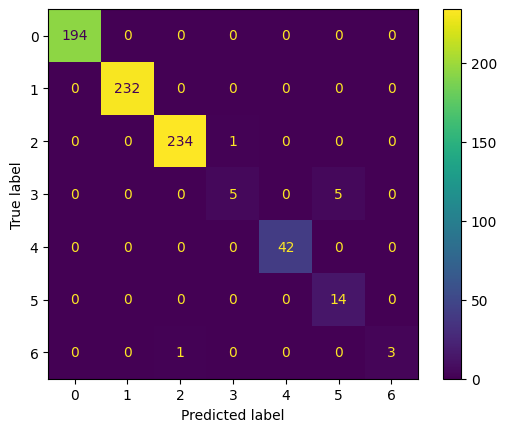

In [ ]:
# confusion matrix
from sklearn import metrics

actual = df_test["class"]
predicted = df_test["pred_class"]

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1 , 2, 3, 4, 5, 6])

cm_display.plot()
plt.show()

In [ ]:
num_correct = 0
num_incorrect = 0

for i in range(df_test.shape[0]):
  if int(df_test["class"][i]) == int(df_test["pred_class"][i]):
    num_correct += 1
  else:
    num_incorrect += 1

print("accuracy = " + str(num_correct/(num_correct + num_incorrect)))

accuracy = 0.9904240766073872


In [ ]:
# split into dataframes for each cluster

clusters = np.unique(np.array(feats_df["class"])) # list of unique clusters

cluster_dfs = [] # list of dfs for each cluster

for i in clusters:
  df = df_test[df_test["pred_class"] == i]
  df.reset_index(inplace = True, drop = True)
  cluster_dfs.append(df)

# print sizes of each pred_cluster
class_num = 0
for df in cluster_dfs:
  print(str(class_num) + ": " + str(df.shape[0]))
  class_num += 1

0: 194
1: 232
2: 235
3: 6
4: 42
5: 19
6: 3


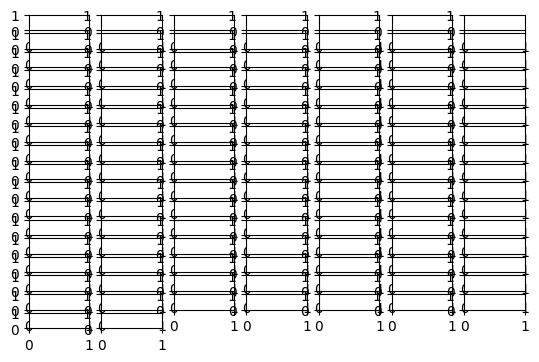

In [ ]:
# visualize images from each predicted class:

# print out random images from clusters

num_imgs = 20

fig, ax = plt.subplots(num_imgs, len(cluster_dfs))

for i in range(num_imgs):
  for j in range(len(cluster_dfs)):
    df = cluster_dfs[j]
    num = np.random.randint(low = 0, high= df.shape[0], size=1, dtype=int)[0]
    img = np.array(Image.open(df["dir"][num] + df["path"][num]))
    ax[i][j].imshow(img, cmap = "YlOrRd", vmin = 0, vmax = 255)
    ax[i][j].set_title(df["path"][num] + " cluster " + str(j) + " index " + str(num), fontsize = 8)
    ax[i][j].get_xaxis().set_visible(False)
    ax[i][j].get_yaxis().set_visible(False)


fig.set_figwidth(5*len(cluster_dfs))
fig.set_figheight(5 * num_imgs)
plt.show()

In [ ]:

# extract features from the rest of the unclassified images

# import torch
# from torchvision import models

# Load the pretrained model
pred_model = models.resnet50(pretrained=False)
num_ftrs = pred_model.fc.in_features
pred_model.fc = nn.Linear(num_ftrs, 7)
pred_model.cuda()

pred_model.load_state_dict(torch.load("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-15_best_classification_model.pth"))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


<All keys matched successfully>

In [ ]:
# use feats df

with open("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-15_curr_df.pkl", 'rb') as f:
  classified_df = pickle.load(f) # deserialize using load()

with open("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-11_random_indices_array.pkl", 'rb') as f:
  list_range = pickle.load(f) # deserialize using load()
# as of 8-15-14, currently through [0:7307]

with open("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-11_manual_classification.pkl", 'rb') as f:
  feats_df = pickle.load(f) # deserialize using load()

In [ ]:
feats_df = feats_df.drop(list_range[0:7307], axis = "rows")

feats_df.reset_index(inplace = True, drop = True)

In [ ]:
df_clustering = feats_df

# From ChatGPT
# This list will store the features
features = []

def hook(module, input, output):
    features.append(output)

# Register the hook to the final pooling layer
# final_bn = pred_model.layer4[-1].bn3
pred_model.avgpool.register_forward_hook(hook)
# final_bn.register_forward_hook(hook)

pred_model.eval()

counter = 0
# # Load an image
for i in range(df_clustering.shape[0]):
# for i in range(1):
  img_path = df_clustering["dir"][i] + df_clustering["path"][i]
  img = Image.open(img_path)
  img_transformed = data_transforms(img, "val")

  # Pass the image through the model
  with torch.no_grad():
      _ = pred_model(img_transformed.unsqueeze(0).cuda())

  if counter % 500 == 0:
    print(counter)

  counter += 1

  # # The features are stored in the list
  # features = features[0]

  # # Flatten the output tensor if needed
  # features = features.view(features.size(0), -1)

  # print(features.shape)

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000
29500
30000
30500
31000
31500
32000


In [ ]:
# save features in a numpy array

feat_array = np.empty((df_clustering.shape[0], 2048))

for i in range(df_clustering.shape[0]):
  feats = np.array(features[i].cpu()).reshape(2048)
  feat_array[i,:] = feats

In [ ]:
# pickle_out = open("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-19_feat_array_unscaled.pkl","wb")
# pickle.dump(feat_array, pickle_out)
# pickle_out.close()

with open("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-19_feat_array_unscaled.pkl", 'rb') as f:
  feat_array = pickle.load(f) # deserialize using load()

with open("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-18_curr_df.pkl", 'rb') as f:
  df_classes = pickle.load(f) # deserialize using load()

In [ ]:
# PCA on feat arrays

# scaling data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

feat_array_scaled = sc.fit_transform(feat_array)

print(feat_array_scaled.shape)


# Applying PCA function on training
# and testing set of X component
from sklearn.decomposition import PCA

pca = PCA(n_components = 5)

pca_data = pca.fit_transform(feat_array_scaled)


explained_variance = pca.explained_variance_ratio_

print(explained_variance)

df_classes["pc1"] = pca_data[:,0]
df_classes["pc2"] = pca_data[:,1]

(32210, 2048)
[0.297097   0.24055919 0.09804443 0.06278293 0.04223746]


In [ ]:
# # K_means clustering
# from sklearn.cluster import KMeans

# #Find optimum number of clusters
# sse = [] #SUM OF SQUARED ERROR
# for k in range(1,11):
#     km = KMeans(n_clusters=k, random_state=42)
#     km.fit(feat_array_scaled)
#     sse.append(km.inertia_)

# fig, ax = plt.subplots()
# ax.set(xlabel = "num clusters", ylabel = "SSE")

# ax.plot(sse)

In [ ]:
# # K_means clustering
# # from sklearn.cluster import KMeans
# num_clusters = 7
# km = KMeans(n_clusters = num_clusters, init='k-means++', n_init=50, max_iter=300,
#             tol=0.0001, random_state=42)

# clusters = km.fit(feat_array)

In [ ]:
# clusters

# df_clustering["cluster"] = clusters.labels_

In [ ]:
# num_clusters = 7
# clusters = np.arange(0,num_clusters)# list of unique clusters

# cluster_dfs = [] # list of dfs for each cluster

# for i in clusters:
#   df = df_clustering[df_clustering["cluster"] == i]
#   df.reset_index(inplace = True, drop = True)
#   cluster_dfs.append(df)



In [ ]:
# # plot the data

# fig, ax = plt.subplots()

# colors = ["red","green","blue","purple","orange","black","pink"]
# for j in clusters:
#   df = cluster_dfs[j]
#   ax.scatter(df["pc1"], df["pc2"], c = colors[j], label = "cluster " + str(j))


# leg = ax.legend(loc="upper left")

# ax.set(xlabel = "PC1", ylabel = "PC2")
# plt.show()



In [ ]:
# counter = 0
# for cluster in cluster_dfs:
#   print("cluster " + str(counter) + ": " + str(cluster.shape[0]))
#   counter += 1

In [ ]:
# # print out random images from clusters

# num_imgs = 25

# fig, ax = plt.subplots(num_imgs, len(cluster_dfs))

# for i in range(num_imgs):
#   for j in range(len(cluster_dfs)):
#     df = cluster_dfs[j]
#     num = np.random.randint(low = 0, high= df.shape[0], size=1, dtype=int)[0]
#     img = np.array(Image.open(df["dir"][num] + df["path"][num]))
#     ax[i][j].imshow(img, cmap = "YlOrRd", vmin = 0, vmax = 255)
#     ax[i][j].set_title(df["path"][num] + " cluster " + str(j) + " index " + str(num), fontsize = 8)
#     ax[i][j].get_xaxis().set_visible(False)
#     ax[i][j].get_yaxis().set_visible(False)


# fig.set_figwidth(5*len(cluster_dfs))
# fig.set_figheight(5 * num_imgs)
# plt.show()

In [ ]:
# #initialize new model with same architecture as the one that was trained
# pred_model = models.resnet50(pretrained=False)
# num_ftrs = pred_model.fc.in_features
# pred_model.fc = nn.Linear(num_ftrs, 7)
# pred_model.cuda()

# #apply saved weights to the model
# pred_model.load_state_dict(torch.load("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-15_best_classification_model.pth"))

# #set model mode to eval
# pred_model.eval()

In [ ]:
# df_classes = feats_df

# def data_transforms(image, mode):
#   if mode == "train":
#     tnsfrm = transforms.Compose([
#             # transforms.RandomResizedCrop(224),
#             transforms.RandomHorizontalFlip(),
#             transforms.RandomVerticalFlip(),
#             transforms.ToTensor()
#         ])
#   elif mode == "val":
#     tnsfrm = transforms.Compose([
#             transforms.ToTensor(),
#             transforms.Resize((224,224))
#     ])

#   img = tnsfrm(image)
#   img = torch.cat((img,img,img),0)
#   return img

# #choose image

# #make predictions on the image
# preds = []
# counter = 0

# with torch.no_grad():
#   for i in range(df_classes.shape[0]):
#     pred_image = np.array(Image.open(df_classes["dir"][i] + df_classes["path"][i]))
#     pred_img_transformed = data_transforms(pred_image,"val")
#     preds.append((pred_model(pred_img_transformed.unsqueeze(0).cuda())))

#     if counter % 500 == 0:
#       print(counter)

#     counter += 1


In [ ]:
# # add preds to df
# pred_class = []

# for i in preds:
#   p = i.cpu()
#   argmax = np.argmax(p)
#   pred_class.append(int(argmax))


# df_classes["pred_class"] = pred_class

In [ ]:
np.unique(np.array(df_classes["pred_class"]))

array([0, 1, 2, 3, 4, 5, 6])

In [ ]:
# # PCA on feat arrays

# # scaling data
# from sklearn.preprocessing import StandardScaler
# sc = StandardScaler()

# feat_array_scaled = sc.fit_transform(feat_array)

# print(feat_array_scaled.shape)


# # Applying PCA function on training
# # and testing set of X component
# from sklearn.decomposition import PCA

# pca = PCA(n_components = 2)

# pca_data = pca.fit_transform(feat_array_scaled)


# explained_variance = pca.explained_variance_ratio_

# print(explained_variance)

# df_clustering["pc1"] = pca_data[:,0]
# df_clustering["pc2"] = pca_data[:,1]

In [ ]:
df_classes[df_classes["pred_class"] == 3]

,class,noise,path,seed,dir,pred_class,pc1,pc2
125,None,2,151.png,151,/content/05-09-2024_all_images/,3,16.149898,-7.827313
416,None,2,505.png,505,/content/05-09-2024_all_images/,3,14.862702,-5.679024
448,None,2,541.png,541,/content/05-09-2024_all_images/,3,15.336272,-4.208810
654,None,2,809.png,809,/content/05-09-2024_all_images/,3,11.945388,-1.699136
1142,None,2,1378.png,1378,/content/05-09-2024_all_images/,3,18.838406,-5.776015
...,...,...,...,...,...,...,...,...
31618,None,4,noise 4 22346.0.png,22346.0,/content/Generated_Images_7-2-24/,3,8.555226,-1.572443
31998,None,4,noise 4 23764.0.png,23764.0,/content/Generated_Images_7-2-24/,3,11.337396,-1.263603
32013,None,6,noise 6 24081.0.png,24081.0,/content/Generated_Images_7-2-24/,3,17.838441,-5.395633
32080,None,7,noise 7 20895.0.png,20895.0,/content/Generated_Images_7-2-24/,3,15.437509,-4.099449


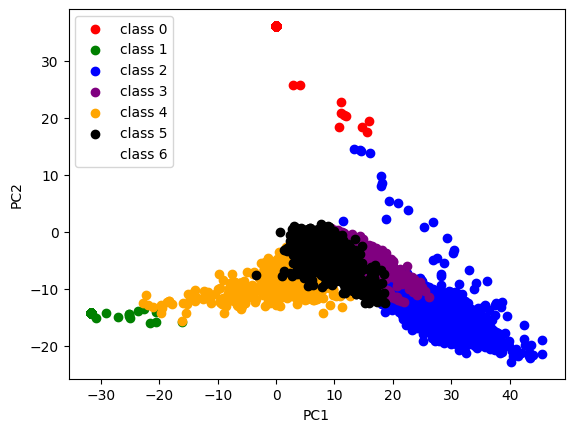

In [ ]:
# plot the model predicted class in feature space


num_classes = 7
classes = np.arange(0,num_classes)# list of unique clusters

class_dfs = [] # list of dfs for each cluster

for i in classes:
  df = df_classes[df_classes["pred_class"] == i]
  df.reset_index(inplace = True, drop = True)
  class_dfs.append(df)


fig, ax = plt.subplots()

colors = ["red","green","blue","purple","orange","black","pink"]
alpha = [1,1,1,1,1,1,0]
for j in classes:
  df = class_dfs[j]
  ax.scatter(df["pc1"], df["pc2"], c = colors[j], label = "class " + str(j), alpha = alpha[j])


leg = ax.legend(loc="upper left")

ax.set(xlabel = "PC1", ylabel = "PC2")
plt.show()



In [ ]:
# print out random images from clusters

num_imgs = 50

fig, ax = plt.subplots(num_imgs, len(class_dfs))

for i in range(num_imgs):
  for j in range(len(class_dfs)):
    df = class_dfs[j]
    num = np.random.randint(low = 0, high= df.shape[0], size=1, dtype=int)[0]
    img = np.array(Image.open(df["dir"][num] + df["path"][num]))
    ax[i][j].imshow(img, cmap = "YlOrRd", vmin = 0, vmax = 255)
    ax[i][j].set_title(df["path"][num] + " cluster " + str(j) + " index " + str(num), fontsize = 8)
    ax[i][j].get_xaxis().set_visible(False)
    ax[i][j].get_yaxis().set_visible(False)


fig.set_figwidth(5*len(class_dfs))
fig.set_figheight(5 * num_imgs)
plt.show()

In [ ]:
# pickle_out = open("/content/drive/MyDrive/2024_Summer_Work_(Shared_Drive_Is_Full)/2024-08-18_curr_df.pkl","wb")
# pickle.dump(df_classes, pickle_out)
# pickle_out.close()

In [ ]:
counter = 0
for cluster in class_dfs:
  print("cluster " + str(counter) + ": " + str(cluster.shape[0]))
  counter += 1

cluster 0: 8724
cluster 1: 10270
cluster 2: 10435
cluster 3: 532
cluster 4: 1266
cluster 5: 908
cluster 6: 75
